<a href="https://colab.research.google.com/github/ABD-01/Siamese-Triplet/blob/master/Siamese_ORL_ResNet/Siamese_ORL(ResNet)v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import glob
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image as Image
import cv2
from itertools import combinations 
from collections import OrderedDict
from tqdm import tqdm
from sklearn.decomposition import PCA
 
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
 
import torchvision
import torchvision.transforms as transforms

In [3]:
!pip install mtcnn

     |████████████████████████████████| 2.3MB 5.9MB/s 


In [4]:
from mtcnn.mtcnn import MTCNN

In [2]:
torch.cuda.is_available()

True

In [6]:
def seed_init():
    np.random.seed(0)
    random.seed(0)
    torch.manual_seed(0)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(0)
        torch.cuda.manual_seed_all(0)
    torch.backends.cudnn.enabled = False
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
 
# ref : https://discuss.pytorch.org/t/random-seed-initialization/7854/19

In [7]:
seed_init()

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
PATH = '/content/drive/MyDrive/Colab Notebooks/att_face_dataset/'

In [9]:
class CustomDataset(Dataset):
 
    def __init__(self, path, transform=transforms.ToTensor()):
        self.dirs = glob.glob(f'{path}*/')
        self.transform = transform
        
        self.total_images = self._get_images(self.dirs, self.transform)
 
    def _get_images(self, dirs, transform):
        ti = []
        for dir in tqdm(dirs):
#             images = [transform(Image.open(image)).squeeze() for image in glob.glob(f'{dir}*')]
            images = [transform(Image.open(image)) for image in glob.glob(f'{dir}*')]
            ti.append(images)
        return ti
        
    def __len__(self):
        return self.dirs.__len__()
    
    def __getitem__(self,idx):
        return torch.stack(self.total_images[idx], dim=0)
# ref : https://pytorch.org/tutorials/beginner/data_loading_tutorial.html

In [10]:
process = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=0.4422, std=0.1931),
])
 
# dataset = list(att_dataset)
# torch.cat(dataset).mean() , torch.cat(dataset).std()
# #  (tensor(0.4417), tensor(0.1958))

In [11]:
att_dataset = CustomDataset(PATH, transform=process)

100%|██████████| 40/40 [01:36<00:00,  2.41s/it]


In [ ]:
att_dataset[0][0].shape

torch.Size([1, 224, 224])

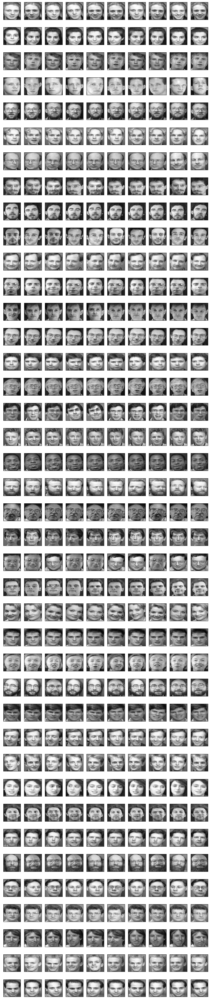

In [ ]:
_,axxr = plt.subplots(40,10, figsize=(12,60))
for i in range(40):
    for j in range(10):
        axxr[i][j].imshow(att_dataset[i][j].squeeze(), cmap='gray')
plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
# ref : https://stackoverflow.com/questions/25124143/matplotlib-subplots-get-rid-of-tick-labels-altogether
plt.show()

In [12]:
dataset = list(att_dataset)
torch.cat(dataset).mean() , torch.cat(dataset).std()
#  (tensor(0.4417), tensor(0.1958))

(tensor(-7.0951e-05), tensor(0.9998))

In [13]:
def triplet_loss(anchor, positive, negative, margin=1):
    pos_dist = (anchor - positive).pow(2).sum(-1) #.pow(.5)
    neg_dist = (anchor - negative).pow(2).sum(-1) #.pow(.5)
    loss = F.relu(pos_dist - neg_dist + margin)
    return loss.mean()
 
# ref: https://github.com/adambielski/siamese-triplet/blob/master/losses.py#L24

In [14]:
def get_random_triplets(embeddings) -> torch.Tensor:
    '''
    For each image in data (Anchor), randomly sample a Positive image from its class.  
    Then from each of the other classes sample one image (randomly) as the Negative. Hence, for every Anchor
    you will have 1 randomly selected positive from it's class and randomly selected Negative from each of the n-1 classes 
    where n is total number of classes.  For every Anchor image you would have n-1 triplets.
    So if you're having 3 classes of 10 images each then you would have 60 triplets. 
    '''
 
 
    triplets = []
    temp_list = list(range(len(embeddings)))
    for i, embedding in enumerate(embeddings):
        aclass = temp_list.pop(i)  ## Anchor class
 
        temp_list2 = list(range(len(embedding)))
        for j, anchor in enumerate(embedding):  ## for anchor in anchor class
            aidx = temp_list2.pop(0)
            if len(temp_list2)<1:
                break
            pidx = random.choice(temp_list2)
            positive = embedding[pidx]
 
            for nidx in temp_list:
                negative = random.choice(embeddings[nidx])
 
                # print(f"Anchor Class : {aclass}; anchor image : {j}{aidx}, positive image : {pidx}; negative class : {nidx}")
                triplets.append(torch.stack([anchor, positive, negative], dim=0))
 
            # temp_list2.insert(j,aidx)
            # print()
        temp_list.insert(i, aclass)
 
    return torch.stack(triplets, dim=0)

In [15]:
def dist(enc1,enc2):
    return (enc1 - enc2).pow(2).sum(-1)#.pow(.5)

In [16]:
dataset = torch.stack(dataset)
dataset.shape

torch.Size([40, 10, 1, 224, 224])

In [17]:
train = dataset[0:38,:7,...]
train.shape

torch.Size([38, 7, 1, 224, 224])

In [18]:
test = dataset[0:38,7:,...]
test.shape

torch.Size([38, 3, 1, 224, 224])

In [19]:
test2 = dataset[38:]
test2.shape

torch.Size([2, 10, 1, 224, 224])

In [ ]:
def get_random_triplets_old(embeddings,  targets=None) -> torch.Tensor:
    '''
    For each image in data (Anchor), randomly sample a Positive image from its class.  
    Then from each of the other classes sample one image (randomly) as the Negative. Hence, for every Anchor
    you will have 1 randomly selected positive from it's class and randomly selected Negative from each of the n-1 classes 
    where n is total number of classes.  For every Anchor image you would have n-1 triplets.
    So if you're having 3 classes of 10 images each then you would have 60 triplets. 
    '''
 
 
#     assert len(embeddings) == len(targets) , "Embeddings and Targets must have same lenght"
 
    triplets = []
    for i, embedding in enumerate(embeddings):
        temp = embeddings.pop(i)
 
        for anchor in embedding:
            positive = random.choice(embedding)
 
            for negatives in embeddings:
                negative = random.choice(negatives)
 
                triplets.append(torch.stack([anchor, positive, negative], dim=0))
 
        embeddings.insert(i, temp)
 
    return torch.stack(triplets, dim=0)

In [20]:
class ResidualBlock(nn.Module):
    
    def __init__(self, n_in :int , n_out :int , stride :int = 1, use_1x1conv=False):
        super(ResidualBlock, self).__init__()
 
        self.conv1 = nn.Conv2d(in_channels=n_in, out_channels=n_out, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn1 = nn.BatchNorm2d(num_features=n_out)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(in_channels=n_out, out_channels=n_out, kernel_size=3, stride=1, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(num_features=n_out)
 
        if use_1x1conv:
            self.downsample = nn.Sequential(OrderedDict([
                ('conv', nn.Conv2d(in_channels=n_in, out_channels=n_out, kernel_size=1, stride=stride, padding=0, bias=False)),
                ('bn', nn.BatchNorm2d(num_features=n_out))
            ]))
        else:
            self.downsample = None
 
 
    def forward(self, x):
        x_shortcut = x
 
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
 
        x = self.conv2(x)
        x = self.bn2(x)
 
        if self.downsample:
            x_shortcut = self.downsample(x_shortcut)
 
        x = x + x_shortcut
        x = self.relu(x)
 
        return x
 
# ref : https://d2l.ai/chapter_convolutional-modern/resnet.html
# ref : https://github.com/pytorch/vision/blob/master/torchvision/models/resnet.py#L144

In [21]:
class ResNet(nn.Module):
 
    def __init__(self, layers = [2,2,2,2]):
        # resnet18 : layers = [2, 2, 2, 2]
        # resnet34 : layers = [3, 4, 6, 3]
        super(ResNet, self).__init__()
 
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=64, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = nn.BatchNorm2d(num_features=64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
 
        self.layer1 = nn.Sequential(
            self._make_layer(in_channels = 64, out_channels = 64, num_residuals = layers[0])                                 
        )
                            
        self.layer2 = nn.Sequential(
            self._make_layer(in_channels = 64, out_channels = 128, num_residuals = layers[1], reduce_dim = True) 
         )
 
        self.layer3 = nn.Sequential(
            self._make_layer(in_channels = 128, out_channels = 256, num_residuals = layers[2], reduce_dim = True) 
        )
                            
        self.layer4 = nn.Sequential(
            self._make_layer(in_channels = 256, out_channels = 512, num_residuals = layers[3], reduce_dim = True) 
        )
            
        self.avgpool = nn.AvgPool2d(kernel_size=7)
        # self.avgpool = nn.AdaptiveAvgPool2d(output_size=(1,1))
        self.fc = nn.Sequential(
            nn.Linear(in_features=512*1, out_features=128),
            nn.ReLU(inplace=True)
        )
 
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
 
    def _make_layer(self, in_channels:int, out_channels:int, num_residuals: int, reduce_dim = False):
        block_layers = []
        for i in range(num_residuals):
            if i == 0 and reduce_dim:
                block_layers.append((f'block{i+1}', ResidualBlock(n_in = in_channels, n_out = out_channels, stride=2, use_1x1conv = True)))
            else:
                block_layers.append((f'block{i+1}', ResidualBlock(n_in = out_channels, n_out = out_channels)))
 
        return OrderedDict( block_layers )
    
    # ref : https://d2l.ai/chapter_convolutional-modern/resnet.html
 
 
    def semi_forward(self, x):
 
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
 
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
 
        x = self.avgpool(x)
        x = torch.flatten(input=x, start_dim=1) # ref : https://pytorch.org/docs/stable/generated/torch.flatten.html
        x = self.fc(x)
        return x
 
    def forward(self,triplet):
        # anc = self.semi_forward(triplet[:,0,...])
        # pos = self.semi_forward(triplet[:,1,...])
        # neg = self.semi_forward(triplet[:,2,...])
        
        batch_size = triplet.shape[0]
        # triplet = triplet.view(triplet.shape[0]*triplet.shape[1], triplet.shape[2], triplet.shape[3],triplet.shape[4])
        triplet = triplet.view(triplet.shape[0]*triplet.shape[1], *triplet.shape[2:])
        out = self.semi_forward(triplet)
        out = out.view(batch_size,3, *out.shape[1:])
        return torch.unbind(out,dim=1)
 
# ref : https://towardsdatascience.com/understanding-and-visualizing-resnets-442284831be8

In [ ]:
resnet18 = ResNet()
resnet18.eval()
t1 = torch.rand(10,1,224,224)
t2 = torch.rand(10,1,224,224)
t3 = torch.rand(10,1,224,224)
print('rand', t1.shape)
t = resnet18.conv1(t1)
print('conv1', t.shape)
t = resnet18.maxpool(t)
print('maxpool', t.shape)
t = resnet18.layer1(t)
print('layer1', t.shape)
t = resnet18.layer2(t)
print('layer2', t.shape)
t = resnet18.layer3(t)
print('layer3', t.shape)
t = resnet18.layer4(t)
print('layer4', t.shape)
t = resnet18.avgpool(t)
print('avgpool', t.shape)
t = torch.flatten(t,1)
print('flatten', t.shape)
t = resnet18.fc(t)
print('fc', t.shape)

t = resnet18.semi_forward(t1)
print('semi', t.shape)

ts = torch.stack([t1,t2,t3],dim=1)
print('rand', ts.shape)
t_ = resnet18(ts)
print('resnet18', len(t_))
for a in t_:
     print(a.shape)

rand torch.Size([10, 1, 224, 224])
conv1 torch.Size([10, 64, 112, 112])
maxpool torch.Size([10, 64, 56, 56])
layer1 torch.Size([10, 64, 56, 56])
layer2 torch.Size([10, 128, 28, 28])
layer3 torch.Size([10, 256, 14, 14])
layer4 torch.Size([10, 512, 7, 7])
avgpool torch.Size([10, 512, 1, 1])
flatten torch.Size([10, 512])
fc torch.Size([10, 128])
semi torch.Size([10, 128])
rand torch.Size([10, 3, 1, 224, 224])
resnet18 3
torch.Size([10, 128])
torch.Size([10, 128])
torch.Size([10, 128])


In [ ]:
# (torch.unbind(ts,dim=1)[0] == t1).sum()
(t_[0] == t).sum()

tensor(1280)

In [22]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
count_parameters(resnet18)

11235904

In [23]:
def Train(model, batch, loss_fn, optimizer, cost):
    model.train()
 
    apn = model(batch.cuda())
 
    optimizer.zero_grad()
    loss = loss_fn(*apn)
    cost.append(loss.item())
    loss.backward()
    optimizer.step()
 
    return cost[-1]

In [24]:
def Evaluate(model, batch):
    model.eval()
    def dist(enc1,enc2):
        return (enc1 - enc2).pow(2).sum(-1) #.pow(.5)
 
    with torch.no_grad():
        sample = torch.cat([model.semi_forward(imgs[0].unsqueeze(0).cuda()).cpu() for imgs in batch])
        
        total_enc = [model.semi_forward(img.cuda()).cpu() for img in batch]
        
        pred = [torch.stack([dist(enc,sample).argmin() for enc in total_enc[i]]) for i in range(len(total_enc))]
        # acc = sum([(pred[i] == i).sum() for i in range(len(total_enc))])
        del total_enc
    # return (acc.item() / (len(batch) * 10) )
    return torch.stack(pred)

In [25]:
resnet18 = ResNet(layers=[2,2,2,2])
# resnet26 = ResNet(layers=[2,4,3,3])

In [ ]:
torch.set_grad_enabled(True)
resnet18.train(True)
# resnet26.train(True)

In [26]:
resnet18.cuda()

ResNet(
  (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (block1): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (block2): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(

In [ ]:
learning_rate = 0.0002
optimizer18 = optim.Adam(resnet18.parameters(), lr = learning_rate)
# optimizer26 = optim.Adam(resnet26.parameters(), lr = learning_rate)
torch_triplet_loss = nn.TripletMarginLoss()
if torch.cuda.is_available():
    resnet18 = resnet18.cuda()
    # resnet26 = resnet26.cuda()

In [ ]:
# cost = [float('inf')]
cost18 = [float('inf')]
epoch_cost = []
# cost26 = [float('inf')] 
train_acc = [0]
test_acc = [0]
epochs = 8
for epoch in range(epochs):
 
    triplets = get_random_triplets(train)
    loader = DataLoader(triplets, batch_size=128, shuffle=True)
    epoch_loss = 0
    for i,batch in enumerate(loader):
 
        loss18 = Train(resnet18, batch, triplet_loss, optimizer18, cost18)
        epoch_loss += loss18
        # loss26 = Train(resnet26, batch, triplet_loss, optimizer26, cost26)
        
        # pred = Evaluate(resnet18, train)
        # acc1 = ( (pred == torch.arange(len(pred)).reshape(-1,1)).sum() / (len(pred)*10) ).item()
        # train_acc.append(acc1)
 
        # pred = Evaluate(resnet18, test)
        # acc2 = ( (pred == torch.arange(len(pred)).reshape(-1,1)).sum() / (len(pred)*10) ).item()
        # test_acc.append(acc2)
 
        if (i+1)%20==0 :
            # print(f'Epoch:[{epoch+1}/{epochs}], Step:[{i+1}/87]', 'Cost : {:.2f}, Train Acc: {:.2f}, Test Acc: {:.2f}'.format(loss, acc1, acc2))
            print(f'Epoch:[{epoch+1}/{epochs}], Step:[{i+1}/77]', 'Cost : {:.2f}'.format(loss18))
            # print(f'Epoch:[{epoch+1}/{epochs}], Step:[{i+1}/87]', 'Cost18 : {:.2f} Cost26 : {:.2f}'.format(loss18,loss26))
    epoch_cost.append(epoch_loss)

Epoch:[1/8], Step:[20/77] Cost : 0.02
Epoch:[1/8], Step:[40/77] Cost : 0.05
Epoch:[1/8], Step:[60/77] Cost : 0.05
Epoch:[2/8], Step:[20/77] Cost : 0.00
Epoch:[2/8], Step:[40/77] Cost : 0.00
Epoch:[2/8], Step:[60/77] Cost : 0.00
Epoch:[3/8], Step:[20/77] Cost : 0.01
Epoch:[3/8], Step:[40/77] Cost : 0.00
Epoch:[3/8], Step:[60/77] Cost : 0.00
Epoch:[4/8], Step:[20/77] Cost : 0.00
Epoch:[4/8], Step:[40/77] Cost : 0.00
Epoch:[4/8], Step:[60/77] Cost : 0.00
Epoch:[5/8], Step:[20/77] Cost : 0.00
Epoch:[5/8], Step:[40/77] Cost : 0.00
Epoch:[5/8], Step:[60/77] Cost : 0.01
Epoch:[6/8], Step:[20/77] Cost : 0.00
Epoch:[6/8], Step:[40/77] Cost : 0.00
Epoch:[6/8], Step:[60/77] Cost : 0.00
Epoch:[7/8], Step:[20/77] Cost : 0.01
Epoch:[7/8], Step:[40/77] Cost : 0.00
Epoch:[7/8], Step:[60/77] Cost : 0.00
Epoch:[8/8], Step:[20/77] Cost : 0.01
Epoch:[8/8], Step:[40/77] Cost : 0.02
Epoch:[8/8], Step:[60/77] Cost : 0.00


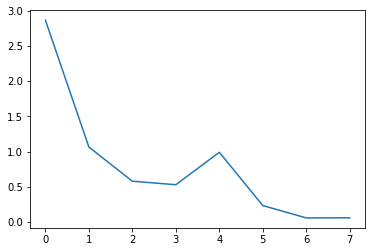

In [ ]:
plt.plot(np.arange(len(epoch_cost)), epoch_cost, label='Epoch Losses')

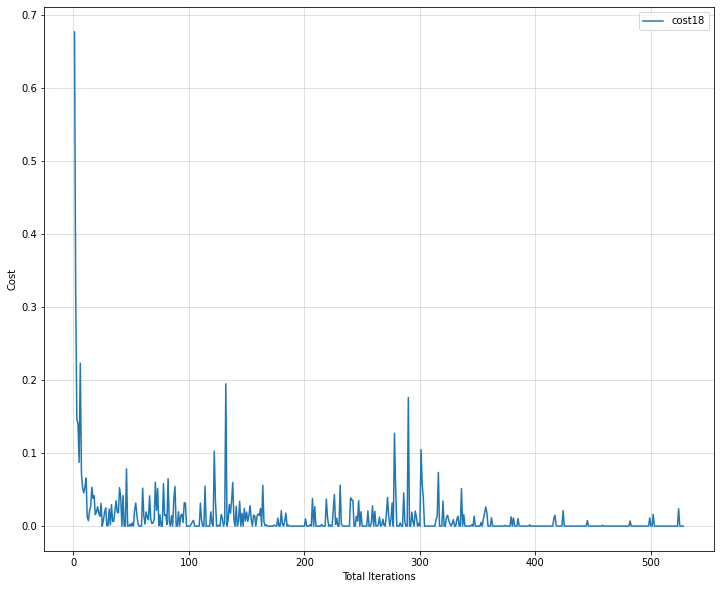

In [ ]:
plt.figure(figsize=(12,10))
plt.xlabel('Total Iterations')
plt.ylabel('Cost')
# plt.plot(np.arange(len(cost)), cost, label='cost')
plt.plot(np.arange(len(cost18)), cost18, label='cost18')
# plt.plot(np.arange(len(cost26)), cost26, label='cost26')
# plt.plot(np.arange(len(train_acc)), train_acc, label='train_acc')
# plt.plot(np.arange(len(test_acc)), test_acc, label='test_acc')
plt.grid(alpha=0.5)
plt.legend()
plt.savefig('/content/drive/MyDrive/Colab Notebooks/siamese-orl-loss on 38classes(resnet18)6')
plt.show()

In [ ]:
plt.figure(figsize=(12,10))
plt.xlabel('Total Iterations')
plt.ylabel('Accuracy')
plt.plot(np.arange(len(train_acc)), train_acc, label='train_acc')
plt.plot(np.arange(len(test_acc)), test_acc, label='test_acc')
plt.grid(alpha=0.5)
plt.legend()
# plt.savefig('/content/drive/MyDrive/Colab Notebooks/siamese-orl-loss on 30classes(resnet)')
plt.show()

In [52]:
torch.set_grad_enabled(False)
resnet18.train(False)
# resnet26.train(False)

In [ ]:
resnet18.cuda()

In [ ]:
total_enc = torch.stack([resnet18.semi_forward(img.cpu()).cpu() for img in tqdm(dataset)])
total_enc.shape

In [47]:
train_enc = total_enc[0:38,:7,...]
train_enc.shape

torch.Size([38, 7, 128])

In [48]:
test_enc = total_enc[0:38,7:,...]
test_enc.shape

torch.Size([38, 3, 128])

In [50]:
test2_enc = total_enc[38:]
test2_enc.shape

torch.Size([2, 10, 128])

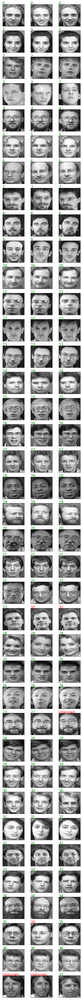

In [ ]:
# ## Showing test dataset
# grid = torchvision.utils.make_grid(test.reshape(38*3,1,224,224), nrow=3, pad=100)
# plt.figure(figsize=(30,120))
# plt.imshow(np.transpose(grid, (1,2,0)))
threshold = 5
pred_matrix_test = []
shape = test_enc.shape
_,axxr = plt.subplots(shape[0],shape[1], figsize=(shape[1]*2,shape[0]*2))
 
for i in range(shape[0]):
 
    pred_class = []
    for j in range(shape[1]):
        axxr[i][j].imshow(test[i][j].squeeze(), cmap='gray')
        
        mean_dists = torch.mean(dist(train_enc,test_enc[i][j]) , dim=1)
        pred_idx =  mean_dists.argmin().item() if  (mean_dists.min() < threshold) else -1

        if pred_idx == -1:
            axxr[i][j].text(0.5,2,"Unknown ", color='red', fontsize=15)
            pred_class.append(-1)
        else:
            if pred_idx == i:
                axxr[i][j].text(0.5,2,f'{pred_idx}', color='green', fontsize=15)
                pred_class.append(pred_idx)
            else:
                axxr[i][j].text(0.5,2,f'{pred_idx}', color='red', fontsize=15)
                pred_class.append(-1)
            
    pred_matrix_test.append(pred_class)
 
plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
# ref : https://stackoverflow.com/questions/25124143/matplotlib-subplots-get-rid-of-tick-labels-altogether
plt.savefig('/content/drive/MyDrive/Colab Notebooks/Prediction on dataset[:38,7:,...]3.png', dpi=200)
plt.show()

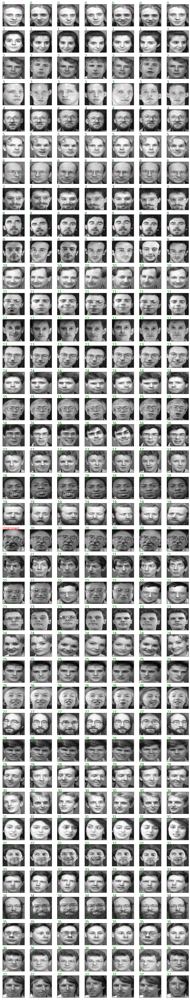

In [ ]:
threshold = 5
pred_matrix_train = []
shape = train_enc.shape
_,axxr = plt.subplots(shape[0],shape[1], figsize=(shape[1]*2,shape[0]*2))

for i in range(shape[0]):

    pred_class = []
    for j in range(shape[1]):
        axxr[i][j].imshow(train[i][j].squeeze(), cmap='gray')
        
        mean_dists = torch.mean(dist(train_enc,train_enc[i][j]) , dim=1)
        pred_idx =  mean_dists.argmin().item() if  (mean_dists.min() < threshold) else -1

        if pred_idx == -1:
            axxr[i][j].text(0.5,2,"Unknown ", color='red', fontsize=15)
            pred_class.append(-1)
        else:
            if pred_idx == i:
                axxr[i][j].text(0.5,2,f'{pred_idx}', color='green', fontsize=15)
                pred_class.append(pred_idx)
            else:
                axxr[i][j].text(0.5,2,f'{pred_idx}', color='red', fontsize=15)
                pred_class.append(-1)
            
    pred_matrix_train.append(pred_class)

plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
# ref : https://stackoverflow.com/questions/25124143/matplotlib-subplots-get-rid-of-tick-labels-altogether
plt.savefig('/content/drive/MyDrive/Colab Notebooks/Prediction on dataset[:38,:7,...]3.png', dpi=200)
plt.show()

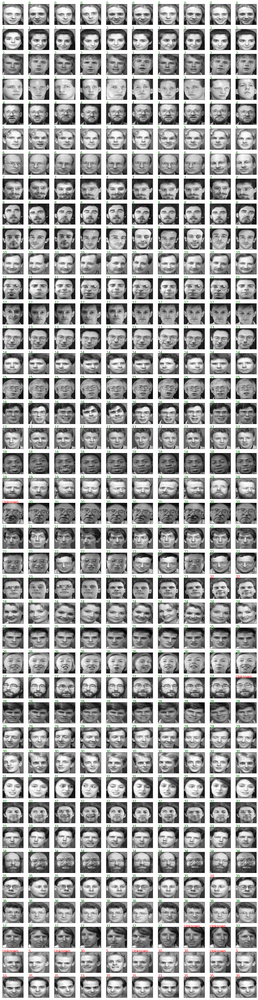

In [ ]:
threshold = 5
pred_matrix_total = []
shape = total_enc.shape
_,axxr = plt.subplots(shape[0],shape[1], figsize=(shape[1]*2,shape[0]*2))

for i in range(shape[0]):

    pred_class = []
    for j in range(shape[1]):
        axxr[i][j].imshow(dataset[i][j].squeeze(), cmap='gray')
        
        mean_dists = torch.mean(dist(train_enc,total_enc[i][j]) , dim=1)
        pred_idx =  mean_dists.argmin().item() if  (mean_dists.min() < threshold) else -1

        if pred_idx == -1:
            axxr[i][j].text(0.5,2,"Unknown ", color='red', fontsize=15)
            pred_class.append(-1)
        else:
            if pred_idx == i:
                axxr[i][j].text(0.5,2,f'{pred_idx}', color='green', fontsize=15)
                pred_class.append(pred_idx)
            else:
                axxr[i][j].text(0.5,2,f'{pred_idx}', color='red', fontsize=15)
                pred_class.append(-1)
            
    pred_matrix_total.append(pred_class)

plt.setp(plt.gcf().get_axes(), xticks=[], yticks=[])
# ref : https://stackoverflow.com/questions/25124143/matplotlib-subplots-get-rid-of-tick-labels-altogether
plt.savefig('/content/drive/MyDrive/Colab Notebooks/Prediction on dataset[:40,:,...]3.png', dpi=200)
plt.show()

In [ ]:
def dist(enc1,enc2):
    return (enc1 - enc2).pow(2).sum(-1)#.pow(.5)

In [ ]:
(np.array(pred_matrix_test) != -1).sum() / (3*38)

0.9473684210526315

In [ ]:
(np.array(pred_matrix_train) != -1).sum() / (7*38)

0.9962406015037594

In [ ]:
(np.array(pred_matrix_total) != -1).sum() / (10*40)

0.9275

tensor(24)
tensor(1.1839)
Predicted Class :  24


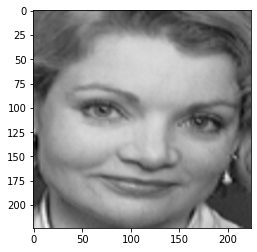

In [83]:
### show image
Class = 24
idx = 8
plt.imshow(dataset[Class][idx].squeeze(), cmap='gray')
mean_dists = torch.mean(dist(train_enc,total_enc[Class][idx]) , dim=1)
pred_idx =  mean_dists.argmin().item() if  (mean_dists.min() < 5) else -1
print(mean_dists.argmin())
print(mean_dists.min())

if pred_idx == -1:
    print("Unknown Person")
else:
    print("Predicted Class : ", pred_idx)

In [84]:
mean_dists

tensor([ 9.7649, 40.5477, 18.4022, 18.8072, 46.1710, 11.2361,  5.3513,  9.9220,
        42.6518, 27.8948,  5.8634, 12.8053, 28.0638, 27.0471, 29.5396, 13.8359,
        39.8164, 26.5316, 67.0197, 14.1442, 47.6627, 44.0083, 32.5485, 22.6290,
         1.1839, 27.0960,  7.4388, 32.1961, 43.7173, 11.2849,  8.3967, 18.5635,
        32.7499, 29.3596, 41.1371, 14.3720, 14.0645, 49.2800])

In [ ]:
dist(train_enc[23][5],test_enc[Class][idx])#.mean()

tensor(20.2383)

In [30]:
# extract a single face from a given photograph
def extract_face(image, required_size=(224, 224)):
    # image = cv2.imread('avatar.jpg')
    # detect faces in the image
    detector = MTCNN()
    # detect faces in the image
    results = detector.detect_faces(image)
    if len(results) < 1:
        return None
    # extract the bounding box from the first face
    x1, y1, width, height = results[0]['box']
    # bug fix
    x1, y1 = abs(x1), abs(y1)
    x2, y2 = x1 + width, y1 + height

    face = image[y1:y2, x1:x2]
    face = cv2.resize(face, required_size)
    gray = cv2.cvtColor(face, cv2.COLOR_BGR2GRAY)
    return gray, (results[0]['box'])

In [57]:
image = cv2.imread('avatar.jpg')
face, box = extract_face(image)

image2 = cv2.imread('photo.jpg')
face2, box2 = extract_face(image2)

image3 = cv2.imread('abdu.JPG')
face3, box3 = extract_face(image3)

image4 = cv2.imread('AW.jpg')
face4, box4 = extract_face(image4)

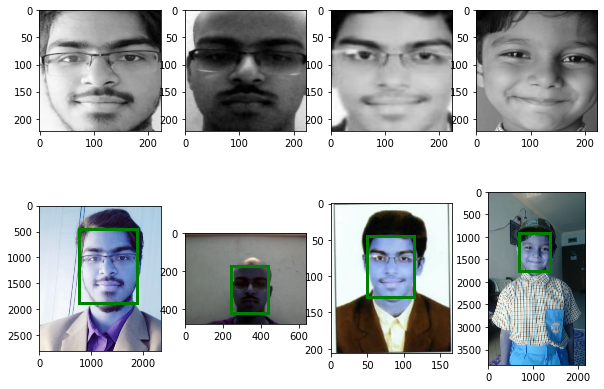

In [58]:
_, axxar = plt.subplots(2,4, figsize=(10,7))
axxar[0][0].imshow(face, cmap='gray')
axxar[0][1].imshow(face2, cmap='gray')
axxar[0][2].imshow(face3, cmap='gray')
axxar[0][3].imshow(face4, cmap='gray')

axxar[1][0].imshow(image)
axxar[1][0].add_patch(patches.Rectangle((box[0], box[1]),box[2], box[3], fill=False, lw=3, ec='g'))

axxar[1][1].imshow(image2)
axxar[1][1].add_patch(patches.Rectangle((box2[0], box2[1]),box2[2], box2[3], fill=False, lw=3, ec='g'))

axxar[1][2].imshow(image3)
axxar[1][2].add_patch(patches.Rectangle((box3[0], box3[1]),box3[2], box3[3], fill=False, lw=3, ec='g'))

axxar[1][3].imshow(image4)
axxar[1][3].add_patch(patches.Rectangle((box4[0], box4[1]),box4[2], box4[3], fill=False, lw=3, ec='g'))

In [96]:
# face_tensor = torch.Tensor(face).unsqueeze(0)
# face_tensor2 = torch.Tensor(face2).unsqueeze(0)
# face_tensor3 = torch.Tensor(face3).unsqueeze(0)
# face_tensor4 = torch.Tensor(face4).unsqueeze(0)
process = transforms.Compose([
    transforms.Resize((224,224)),
    # transforms.ToTensor(),
    transforms.Normalize(mean=0.04422, std=0.01931),
])
face_tensor = process(face_tensor)
face_tensor2 = process(face_tensor2)
face_tensor3 = process(face_tensor3)
face_tensor4 = process(face_tensor4)

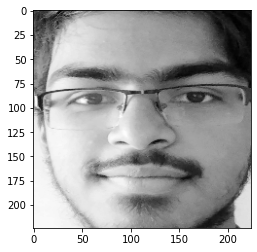

In [97]:
plt.imshow(face_tensor.squeeze(), cmap='gray')

In [98]:
face_tensor.shape, face_tensor2.shape, face_tensor3.shape, face_tensor4.shape

(torch.Size([1, 224, 224]),
 torch.Size([1, 224, 224]),
 torch.Size([1, 224, 224]),
 torch.Size([1, 224, 224]))

In [99]:
face_enc = resnet18.semi_forward(face_tensor.unsqueeze(0).cuda()).cpu()
face_enc2 = resnet18.semi_forward(face_tensor2.unsqueeze(0).cuda()).cpu()
face_enc3 = resnet18.semi_forward(face_tensor3.unsqueeze(0).cuda()).cpu()
face_enc4 = resnet18.semi_forward(face_tensor4.unsqueeze(0).cuda()).cpu()

In [100]:
faces = torch.stack([face_enc, face_enc2, face_enc4])

In [101]:
face_dist = dist(faces, face_enc3)
# mean_dists = torch.mean(face_dist , dim=1)
pred_idx =  face_dist.argmin().item() #if  (mean_dists.min() < threshold) else -1
print(pred_idx)
if face_dist.min() < 4:
    print("Same Person")
else: 
    print("Different")
face_dist

2
Different


tensor([[1.3257e+12],
        [3.0377e+10],
        [4.4426e+09]])

In [39]:
(face_enc - face_enc2).pow(2).sum()

tensor(432585.6875, grad_fn=<SumBackward0>)

In [ ]:
!pip install face-recognition

In [13]:
# import face_recognition
known_image = face_recognition.load_image_file("AW_face.jpg")
unknown_image = face_recognition.load_image_file("avatar.jpg")

biden_encoding = face_recognition.face_encodings(known_image)[0]
unknown_encoding = face_recognition.face_encodings(unknown_image)[0]

results = face_recognition.compare_faces([biden_encoding], unknown_encoding)

In [14]:
results

[False]

In [ ]:
pca = PCA(n_components=2)
x = total_enc[:5].detach()
principalComponents = [pca.fit_transform(i) for i in x]

In [ ]:
len(principalComponents), principalComponents[2].shape

(5, (10, 2))

In [ ]:
def plot_embeddings(principalComponents, targets):
    # plt.figure(figsize=(15,15))
    plt.figure()
    for i,pc in enumerate(principalComponents) :
        plt.scatter(pc[:,0], pc[:,1], alpha=0.5, label=f'{targets[i]}')
    plt.legend()
    plt.show()

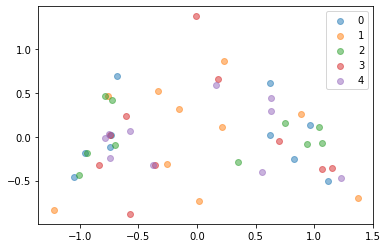

In [ ]:
plot_embeddings(principalComponents, list(range(5)))

In [27]:
# Saving the state_dict of Model
PATH = '/content/drive/MyDrive/Colab Notebooks/siamese-orl(resnet)6.pth'

In [ ]:
# torch.save(resnet18.state_dict(), PATH)

In [ ]:
# resnet18.load_state_dict(torch.load(PATH,  map_location=torch.device('cpu')))
resnet18.load_state_dict(torch.load(PATH))
resnet18.eval()

In [ ]:
(resnet18.layer4.block2.conv1.weight <0.0000000001).sum()

tensor(1178840)

In [ ]:
resnet18.layer4.block2.conv2.weight.flatten().shape

torch.Size([2359296])

(array([1.24000e+02, 4.21600e+03, 5.89250e+04, 3.37886e+05, 7.97112e+05,
        7.83950e+05, 3.19309e+05, 5.38760e+04, 3.79100e+03, 1.07000e+02]),
 array([-0.10324977, -0.08263753, -0.06202529, -0.04141304, -0.0208008 ,
        -0.00018856,  0.02042368,  0.04103592,  0.06164816,  0.0822604 ,
         0.10287264], dtype=float32),
 <a list of 10 Patch objects>)

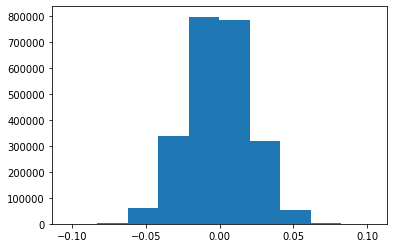

In [ ]:
plt.hist(resnet18.layer4.block2.conv2.weight.flatten().cpu().detach())

In [ ]:
tensor = torch.stack( [torch.stack([torch.arange(1,11), torch.arange(11,21), torch.arange(21,31)]) , torch.stack([torch.arange(31,41), torch.arange(41,51), torch.arange(51,61)])] )
tensor

tensor([[[ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10],
         [11, 12, 13, 14, 15, 16, 17, 18, 19, 20],
         [21, 22, 23, 24, 25, 26, 27, 28, 29, 30]],

        [[31, 32, 33, 34, 35, 36, 37, 38, 39, 40],
         [41, 42, 43, 44, 45, 46, 47, 48, 49, 50],
         [51, 52, 53, 54, 55, 56, 57, 58, 59, 60]]])

In [ ]:
help(torch.cat)

Help on built-in function cat:

cat(...)
    cat(tensors, dim=0, *, out=None) -> Tensor
    
    Concatenates the given sequence of :attr:`seq` tensors in the given dimension.
    All tensors must either have the same shape (except in the concatenating
    dimension) or be empty.
    
    :func:`torch.cat` can be seen as an inverse operation for :func:`torch.split`
    and :func:`torch.chunk`.
    
    :func:`torch.cat` can be best understood via examples.
    
    Args:
        tensors (sequence of Tensors): any python sequence of tensors of the same type.
            Non-empty tensors provided must have the same shape, except in the
            cat dimension.
        dim (int, optional): the dimension over which the tensors are concatenated
    
    Keyword args:
        out (Tensor, optional): the output tensor.
    
    Example::
    
        >>> x = torch.randn(2, 3)
        >>> x
        tensor([[ 0.6580, -1.0969, -0.4614],
                [-0.1034, -0.5790,  0.1497]])
        >>

In [ ]:
out = tensor.view(tensor.shape[0]*tensor.shape[1], *tensor.shape[2:])
out

tensor([[ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10],
        [11, 12, 13, 14, 15, 16, 17, 18, 19, 20],
        [21, 22, 23, 24, 25, 26, 27, 28, 29, 30],
        [31, 32, 33, 34, 35, 36, 37, 38, 39, 40],
        [41, 42, 43, 44, 45, 46, 47, 48, 49, 50],
        [51, 52, 53, 54, 55, 56, 57, 58, 59, 60]])

In [ ]:
apn = out.view(2,3, out.shape[1])
apn

tensor([[[ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10],
         [11, 12, 13, 14, 15, 16, 17, 18, 19, 20],
         [21, 22, 23, 24, 25, 26, 27, 28, 29, 30]],

        [[31, 32, 33, 34, 35, 36, 37, 38, 39, 40],
         [41, 42, 43, 44, 45, 46, 47, 48, 49, 50],
         [51, 52, 53, 54, 55, 56, 57, 58, 59, 60]]])

In [ ]:
apn[:,0,...]

tensor([[ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10],
        [31, 32, 33, 34, 35, 36, 37, 38, 39, 40]])

In [ ]:
torch.unbind(apn,dim=1)

(tensor([[ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10],
         [31, 32, 33, 34, 35, 36, 37, 38, 39, 40]]),
 tensor([[11, 12, 13, 14, 15, 16, 17, 18, 19, 20],
         [41, 42, 43, 44, 45, 46, 47, 48, 49, 50]]),
 tensor([[21, 22, 23, 24, 25, 26, 27, 28, 29, 30],
         [51, 52, 53, 54, 55, 56, 57, 58, 59, 60]]))

In [ ]:
type(torch.split(apn,3))

tuple

In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

<IPython.core.display.Javascript object>

Saved to photo.jpg


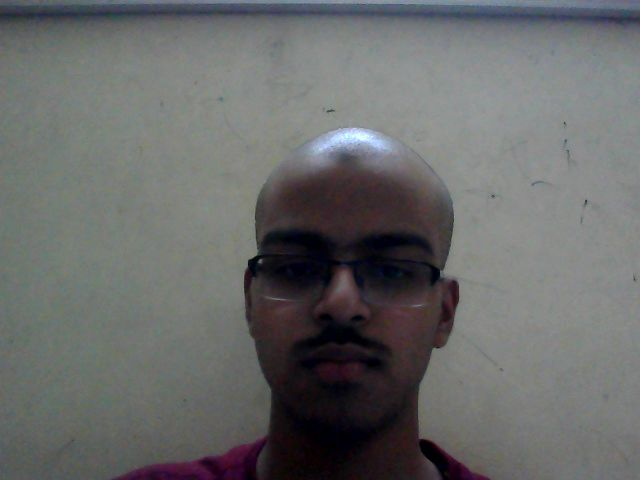

In [ ]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

In [ ]:
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')

In [ ]:
display(js)
data = eval_js('takePhoto({})'.format(0.8))

In [ ]:
binary = b64decode(data.split(',')[1])

In [ ]:
filename = '/content/photo.png'
with open(filename, 'wb') as f:
    f.write(binary)